## BUSINESS CASE -PORTUGUES BANK

**Problem Statement**
- To Prepare a complete data analysis report on the data.
- To Create a predictive model which will help the marketing team to know a customers willingness buy the product.
- To Suggest the Bank marketing team to make customers  buy the product.

#### Business Case
The Business Case of the Portugues Bank is about analizing the banks existing/prospective customers willingness to purchase the term deposit, and to suggest the banks marketing team to improve their promotional activities for the same. all of the given factors pertaining to the banks Term deposit such as **a customers Age, Job, Marital Status, Qualification,	previously held housing	loan, personal loan, previous campaigns held with regards to promotional activities, employee variation rate, consumer price and confidance index, bank landing rates etc. will be taken into consideration** 

This case is a **Binary Classification** Case i.e.To predict whether a customer will or will not buy a product (yes/no) therefore, to analize these factors  **Support Vector Classification, Naive Bayes, Logistic Regression, Decision Tree Analysis and random forest** will be used This will help us identify which customers are likely to buy the product.



## Domain Analysis for Portugese Bank Marketing Campaign:

**Banking Domain**:

**Understanding Banking Products**: Familiarity with banking products, including term deposits, loans,and other financial services.(Columns Covered: Term Deposits, Housing, Loan)

**Customer Account Management**: Banks maintain extensive customer databases, containing demographic information, transaction history, and contact details. Leveraging this data is crucial for targeted marketing campaigns and personalized customer interactions.(Colums Covered: Age,Marital Staus, Job, Education, default,)

**Marketing Domain**: Marketing Strategies: Knowledge of various marketing strategies, including direct phone calls Vs Cellular campaigns. (Contact, Month, day of the week, pdays)
Economic Indicators

**Economic Context**: Awareness of economic indicators like employment variation rate, consumer price index, consumer confidence index, etc., and their potential impact on customer behavior and purchasing decisions.
The domain analysis helps align the problem statement with relevant knowledge and best practices to ensure a successful data analysis and predictive modeling project.

The domain analysis helps align the problem statement with relevant knowledge and best practices to ensure a successful data analysis and predictive modeling project.

## LOGISTIC REGRESSION - MODEL 1

In [244]:
#Imports 

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt 


import warnings
warnings.filterwarnings('ignore')

In [245]:
#read/import csv file

d=pd.read_csv('bank.csv',sep=";")
d

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


#### BASIC CHECKS

In [246]:
d.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


In [247]:
d.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [248]:
d.tail()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
41183,73,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,cellular,nov,fri,...,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,cellular,nov,fri,...,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41187,74,retired,married,professional.course,no,yes,no,cellular,nov,fri,...,3,999,1,failure,-1.1,94.767,-50.8,1.028,4963.6,no


In [249]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

# EXPLORATORY DATA ANALYSIS

In [250]:
#rename the TARGET VARIABLE 
import pandas as pd #panelled data

# Rename the column
d.rename(columns={'y': 'subscription'}, inplace=True)

# Display the DataFrame after renaming
print("After renaming:")
print(d)   #done

After renaming:
       age          job  marital            education  default housing loan  \
0       56    housemaid  married             basic.4y       no      no   no   
1       57     services  married          high.school  unknown      no   no   
2       37     services  married          high.school       no     yes   no   
3       40       admin.  married             basic.6y       no      no   no   
4       56     services  married          high.school       no      no  yes   
...    ...          ...      ...                  ...      ...     ...  ...   
41183   73      retired  married  professional.course       no     yes   no   
41184   46  blue-collar  married  professional.course       no      no   no   
41185   56      retired  married    university.degree       no     yes   no   
41186   44   technician  married  professional.course       no      no   no   
41187   74      retired  married  professional.course       no     yes   no   

         contact month day_of_week 

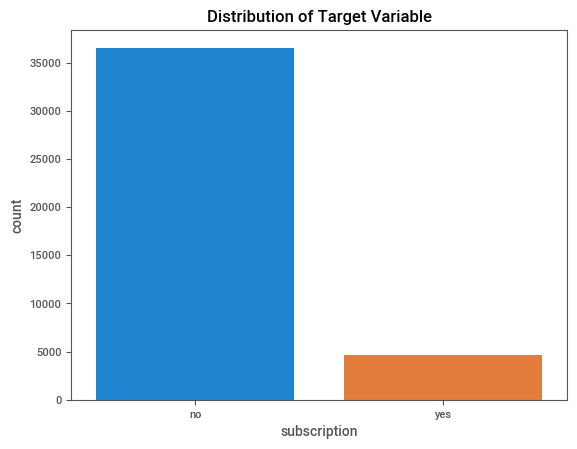

In [251]:
# Check the distribution of the TARGET variable
sns.countplot(x='subscription', data=d)
plt.title('Distribution of Target Variable')
plt.show()

### UNIVARIATE ANALYSIS

In [252]:
#univariate analysis using sweetviz
!pip install sweetviz

In [253]:
import sweetviz as sv#importing sweetviz library 
my_report = sv.analyze(d)#syntax to use sweetviz
my_report.show_html()#Default arguments will generate to "SWEETVIZ_REPORT.html"

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


##### UNIVARIATE ANALYSIS HIGHLIGHTS- REPORT 
- **Age** > the age of bank customers lie between 17 (min) to 98 (max), most clients are between the age 30 t0 50, and the median lies at 38.

- **Jobs** > most of the customers work at admin roles(25%), followed by blue collar jobs and then technicians followed by the servive providers (about 10%).

- **Maritial status** > 60% of the customers are married, about 30% are not married and about 10% divorced.

- **Education/ Qualification** >about 30% of clients have a university degree, about 25% have a high school certification, and about 15% with a basic 9Y, followed by those with only professional course certifications.

- **Loan Defaulters** > about 80% of the customers have no defaulters, and more that 15% have defaultes wheres the status of a small group is yet unknown (these unknown columns will have to bo dropped to avoid errors in our output)

- **housing** > this column explain whethere a customer has a housing loan or not. more than 50% have a housing loan and about 45% done whereas a small percentage of clients (approximately 2%) have an "unknown" housing status.

- **Loans** this column explain whethere a customer has a personal loan or not. more than 80% do not have a personal loan and about more than 15% have a loan. whereas a small percentage of clients (approximately 1-2%) have an "unknown" personal loan status.

- **Contact** >it is observed that more that 60% customers are contacted via cellular devices and the rest via the traditional telephone.

- **Last contacted Month** > most customers were last contacted in the month of may followed by july aug and june. this columns would not be significantly vital to our models calculation and will be dropped.

- **day of the week last contacted** > most customers were last contacted on thursday, followed by Mon, wed, tue, friday.this colums would not be significantly vital to our models calculation and will be dropped.

- **Duration of the last call** > the max duration for the last call would not be significantly vital to our models calculations and will be dropped.

- **Campaign** > the  max number of contacts performed during the last campaign is 56 and least 1. this colums would not be significantly vital to our models calculations and will be dropped.

- **PDAYS** > This denotes the number of days that passed by after the client was last contacted from a previous campaign. 999 signifies that the client was not previously contacted, almost 90% of the clients were not previously contacted, wheres as a very small percentage were contacted.

- **previous**> it denotes the number of contacts performed before this campaign for a client, more than 85% were not contacted and about 10% were contacted atleast once

- **POutcome**> this denotes the outcome of the previous marketing campaign.in this case more than 80% are nonexistant, about 10% a failure and only a small propotion (2-3%) was a success.

- **Employee Variation Rate** > it denotes the variation of how many people are being hired or fired due to the shifts in the conditions of the economy, the highest in this case being 1.4.
- Positive and Negative Employment Variation: The "emp.var.rate" column contains both positive and negative values. Positive values, such as 1.416, 1.17, and 0.210, indicate periods of economic growth and improvement in the employment market. Negative values, such as -1.89, -0.13, and -1.777, indicate periods of economic downturn and decreased employment opportunities.

- **Consumer Price Index** >this index measure changes in the prices of goods and services purchased or acquired by households, in this data set the median index is at 93, the max being 94.77 and min being 93.20, these values only differed slightly by decimal points.

- **Consumer Confidance Index (CCI)** > this index measures and compares how consumers view the overall economy, it infers that when consumers are optimistic, they spend more, stimulating the economy, but when pessimistic, spending decline, this would help us gain insights on whether the customers would have the resources to purchase the term deposit of the portugues bank, in this data set the median CCI is -41, and max and min being 26.9 and 50.8.

- **euribor3m** > this is the interest rate at which a selection of European banks lend one another funds denominated in euros whereby the loans have a maturity of 3 months. this median being 4.86% and the max and min being 5.04% and 0.63%

- **nr.employed** > this indicator indicates the number of employees employed, in this dataset the median of employees employed is 5191, and the maximum and minimum employed at a time are; 5228 and 4964 respectively.

- **y or subscription** > this is the target variable, and informs whether the client subscribed towards the term deposit or not (this is a binary classification in the form YES / NO) in the given data set more that 80 % have not subscribed to the term deposit and just more than 10% have subscribed.

### BIVARIATE ANALYSIS

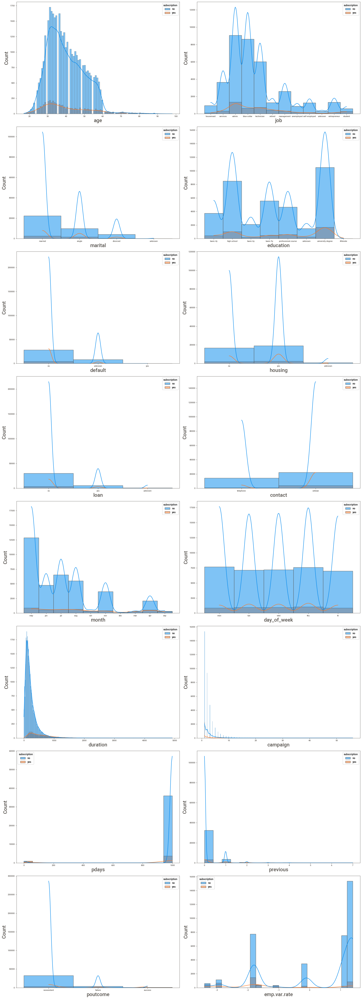

In [254]:
import seaborn as sns

plt.figure(figsize=(20, 55), facecolor='white')
plotnumber = 1

for column in d:
    if plotnumber <= 16:
        ax = plt.subplot(8, 2, plotnumber)
        sns.histplot(data=d, x=column, hue='subscription', kde=True)
        plt.xlabel(column, fontsize=20)
        plt.ylabel('Count', fontsize=20)
    plotnumber += 1
plt.tight_layout()
plt.show()

### BIVARIATE ANALYSIS IN A NUTSHELL
- **age**> most of the subscribers of term deposite lie between the age 30 and 40, the same with nonsubscribers
- **job**> Admin, blue-collar and technician followed by management tend to subscribe more
- **marital status** > Married subscribed more than unmarried and divorced
- **education** >  University Degree holders and high school graduates subscribe more
- **defaulters** > most of the subscribers i.e. 90% and above were non defaulters in credit loans.
- **housing loan** > 50% of the term deposit customers have a housing loan, wheres 45% do not.
- **personal loan** > it is observed that most subscribers have not purchased a personal loan
- **mode od contact** > as seen in the count plot most subscribers were contacted via a cellular device as compared to the telephone
- **month last contacted & day of week last contacted** > this column may not be meaningful to our model calc and will be dropped further. however customers were most contacted last in the month of may, and thursdays in the week column 
- **duration of call** this column may not be meaningful to our model calc and will be dropped further. however the max duration (in seconds) a subscriber was spoken to was 4918 secs
- **campaign** > max number of times a subscriber was contaced during the campaign were 56 times
- **pday** > most subscribers were never contacted before they bought the term deposits
- **previous** > most of the current subscribers were not contacted in the past. this indicates that many customers bought the term deposit without that bank taking the first move.
- **poutcome** > the outcome of the previous campaign on the existing subscribers was mostly nonexistant, or a failure. the impact of the campaign was successful on onlt a few subscribers.

### MULTIVARIATE ANALYSIS

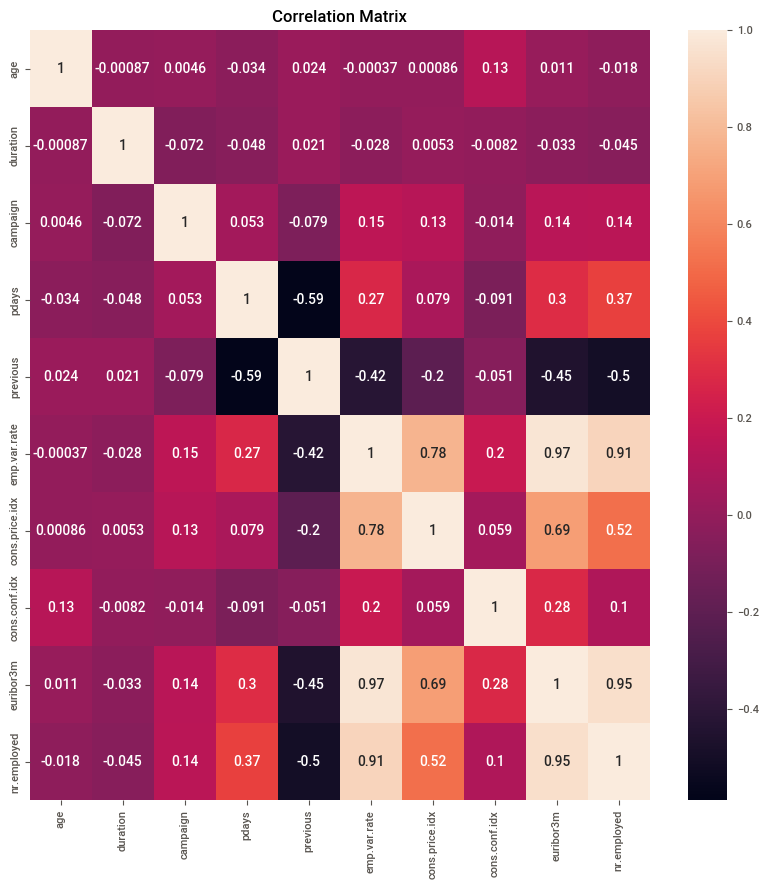

In [255]:
# Explore  correlation
#multi variate analysis
plt.figure(figsize=(10,10)) #To set canvas 
sns.heatmap(d.drop('subscription',axis=1).corr(),annot=True)
plt.title('Correlation Matrix')
plt.show()

#### HIGHLIGHTS OF THE CORRELATION MAXRIX 
- columns such as euribor3 and nr.employed can be dropped as the display high correlation or 90% and above

## DATA PREPROCESSING & FEATURE ENGINEERING
* CATEGORICAL TO NUMERICAL
* OUTLIERS - BOX PLOT
* NULL VALUES 

In [256]:
d.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [257]:
d.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
subscription      0
dtype: int64

### Dropping columns due to relevance in the data set - duration, contact, month, day_of_week
### Dropping columns due to high correlation  in data set- previous, emp.var.rate, cons.price.idx, euribor3m, nr.employed 


###### Reasons as to why Duration, contact, month, day_of_week, poutcome  columns were dropped

- 'contact':whether the call was telephonic or cellular, would not assist us in knowing if a customer would purchase a term deposit.

- 'month': signifies the lst month a customer was called 

- 'day_of_week': last contacted day of a particular week, These variables may not provide significant predictive power or may introduce noise to the model. In such cases, it is in the best interests to remove them to simplify the model and improve interpretability.

- duration: duration of the last cal, By removing this column, one prevents the model from relying on a variable that would not be available in a real-time scenario, thus avoiding potential bias.

- 'poutcome': This column represents the outcome of the "previous marketing campaign".Removing it can help avoid relying on information that may not be relevant or reliable.


In [258]:
d= d.drop(['contact', 'month', 'day_of_week', 'duration','poutcome'], axis=1)

In [259]:
d

,age,job,marital,education,default,housing,loan,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscription
0,56,housemaid,married,basic.4y,no,no,no,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,1,999,0,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,retired,married,professional.course,no,yes,no,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,46,blue-collar,married,professional.course,no,no,no,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,no
41185,56,retired,married,university.degree,no,yes,no,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,no
41186,44,technician,married,professional.course,no,no,no,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,yes


# categorical to numerical

* FINDING UNIQUE VALUES > 
- helps in identifying various unique values 
- identifys variables that can be dropped 

In [260]:
#JOB 
#label encoding
print(d['job'].unique())   #['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired''management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur''student']
                           

['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']


In [261]:
print(d['marital'].unique())   #['married' 'single' 'divorced' 'unknown']
                              

['married' 'single' 'divorced' 'unknown']


In [262]:
print(d['education'].unique())   #['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course''unknown' 'university.degree' 'illiterate']
                              

['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']


In [263]:
print(d['default'].unique())   #['no' 'unknown' 'yes']
                              

['no' 'unknown' 'yes']


In [264]:
print(d['housing'].unique())   #['no' 'yes' 'unknown']
                              

['no' 'yes' 'unknown']


In [265]:
print(d['loan'].unique())    #['no' 'yes' 'unknown']
                           

['no' 'yes' 'unknown']


'UNKNOWN in COLUMNS' 
- all unknown columns should be dropped, as they could alter our outputs, 
- other options to deal with the unknows would be, to replace them with the mode or median as suitable 
- in this data set we prefer to drop the unknowns from all columns, as they are large in number in some columns. replacing  them (using mode or median)in large would only give us a biased result.


### dropping unknown

In [266]:
# Get the number of rows before dropping NaN values
num_rows_before= len(d)
num_rows_before

41188

In [267]:
# Check for "unknown" values in each column
for column in d.columns:
    unknown_count = d[column].loc[d[column] == 'unknown'].count()
    if unknown_count > 0:
        print(f"Column '{column}' has {unknown_count} 'unknown' values.")

Column 'job' has 330 'unknown' values.
Column 'marital' has 80 'unknown' values.
Column 'education' has 1731 'unknown' values.
Column 'default' has 8597 'unknown' values.
Column 'housing' has 990 'unknown' values.
Column 'loan' has 990 'unknown' values.


In [268]:
# Replace "unknown" values with NaN
d.replace('unknown', pd.NA, inplace=True)

# Drop rows with NaN values
d.dropna(inplace=True)

# Now the dataset does not contain rows with "unknown" values

In [269]:
# Get the number of rows after dropping NaN values
num_rows_after = len(d)
num_rows_after

30488

In [270]:
# Print the results
print(f"Number of rows before dropping 'unknown' values: {num_rows_before}")
print(f"Number of rows after dropping 'unknown' values: {num_rows_after}")

#after gathering before and after results

Number of rows before dropping 'unknown' values: 41188
Number of rows after dropping 'unknown' values: 30488


In [271]:
rows_dropped=num_rows_before-num_rows_after
rows_dropped

10700

In [272]:
d.info

<bound method DataFrame.info of        age          job  marital            education default housing loan  \
0       56    housemaid  married             basic.4y      no      no   no   
2       37     services  married          high.school      no     yes   no   
3       40       admin.  married             basic.6y      no      no   no   
4       56     services  married          high.school      no      no  yes   
6       59       admin.  married  professional.course      no      no   no   
...    ...          ...      ...                  ...     ...     ...  ...   
41183   73      retired  married  professional.course      no     yes   no   
41184   46  blue-collar  married  professional.course      no      no   no   
41185   56      retired  married    university.degree      no     yes   no   
41186   44   technician  married  professional.course      no      no   no   
41187   74      retired  married  professional.course      no     yes   no   

       campaign  pdays  previou

### CATEGORICAL TO NUMERICAL

In [273]:
from sklearn.preprocessing import LabelEncoder
categorical_cols = ['job', 'marital', 'education', 'default', 'housing', 'loan']

lc = LabelEncoder()
d[categorical_cols] = d[categorical_cols].apply(lc.fit_transform)

In [274]:
# Create dummy variables for the remaining categorical variables
d = pd.get_dummies(d, drop_first=True)

In [275]:
d #to ensure categorical were converted to numerical

,age,job,marital,education,default,housing,loan,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,subscription_yes
0,56,3,1,0,0,0,0,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
2,37,7,1,3,0,1,0,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
3,40,0,1,1,0,0,0,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
4,56,7,1,3,0,0,1,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
6,59,0,1,5,0,0,0,1,999,0,1.1,93.994,-36.4,4.857,5191.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,5,1,5,0,1,0,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,1
41184,46,1,1,5,0,0,0,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,0
41185,56,5,1,6,0,1,0,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,0
41186,44,9,1,5,0,0,0,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,1


In [276]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split

In [277]:
d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30488 entries, 0 to 41187
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               30488 non-null  int64  
 1   job               30488 non-null  int32  
 2   marital           30488 non-null  int32  
 3   education         30488 non-null  int32  
 4   default           30488 non-null  int32  
 5   housing           30488 non-null  int32  
 6   loan              30488 non-null  int32  
 7   campaign          30488 non-null  int64  
 8   pdays             30488 non-null  int64  
 9   previous          30488 non-null  int64  
 10  emp.var.rate      30488 non-null  float64
 11  cons.price.idx    30488 non-null  float64
 12  cons.conf.idx     30488 non-null  float64
 13  euribor3m         30488 non-null  float64
 14  nr.employed       30488 non-null  float64
 15  subscription_yes  30488 non-null  uint8  
dtypes: float64(5), int32(6), int64(4), uint8

### FINDING OUTLIERS - USING BOX PLOT

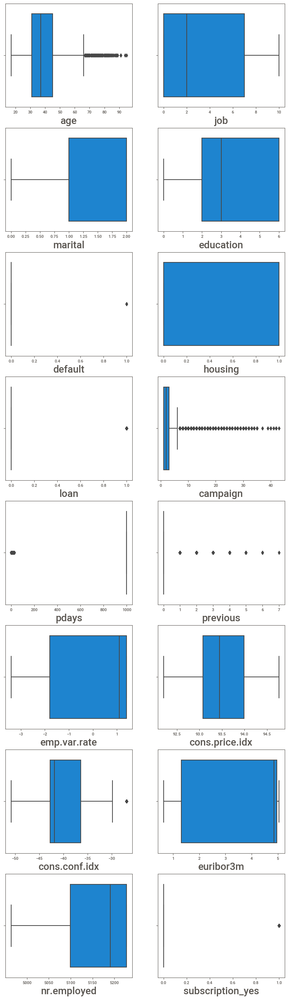

In [278]:
# Checking for outliers
# let's see how data is distributed for every column
plt.figure(figsize=(10,35), facecolor='white')
plotnumber = 1

for column in d:
    if plotnumber<=16 :
        ax = plt.subplot(8,2,plotnumber)
        sns.boxplot(d[column]) 
        plt.xlabel(column,fontsize=20)
        
    plotnumber+=1
plt.show()

**age and campaign column contain a large number of outliers and so we wont be dropping them as the are a large part of our data**


In [279]:
numerical_cols = ['age', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed']

In [280]:
def calculate_outlier_percentage(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    IQR = Q3 - Q1
    outlier_threshold = 1.5 * IQR

    num_outliers = ((column < Q1 - outlier_threshold) | (column > Q3 + outlier_threshold)).sum()
    percentage_outliers = (num_outliers / len(column)) * 100
    return percentage_outliers

In [281]:
# Calculate the percentage of outliers for each numerical column
outlier_percentages = {column: calculate_outlier_percentage(d[column]) for column in numerical_cols}
print("Percentage of outliers in each numerical feature:")
print(outlier_percentages)

Percentage of outliers in each numerical feature:
{'age': 1.5022303857255315, 'campaign': 5.4939648386250335, 'pdays': 4.296772500655996, 'previous': 15.258462345840988, 'emp.var.rate': 0.0, 'cons.price.idx': 0.0, 'cons.conf.idx': 1.2988716872212016, 'euribor3m': 0.0, 'nr.employed': 0.0}


In [282]:
def remove_outliers_zscore(dataframe, threshold=3):
  
    # Create an empty DataFrame to store the filtered data
    filtered_d= pd.DataFrame()

    # Loop through all columns in the DataFrame
    for column in dataframe.columns:
        
        # Calculate the Z-score for the current column
        z_scores = (dataframe[column] - dataframe[column].mean()) / dataframe[column].std()
        
# Filter out the rows with Z-scores above the threshold for the current column
        filtered_d[column] = dataframe[abs(z_scores) < threshold][column]
    
    return filtered_d

# Example usage:
# Assuming you have a DataFrame called 'df' containing all your data
d_cleaned = remove_outliers_zscore(d)

In [283]:
# Calculate the percentage of outliers for each numerical column
outlier_percentages = {column: calculate_outlier_percentage(d_cleaned[column]) for column in numerical_cols}
print("Percentage of outliers in each numerical feature:")
print(outlier_percentages)

Percentage of outliers in each numerical feature:
{'age': 0.4046166091801539, 'campaign': 3.555319713451844, 'pdays': 0.0, 'previous': 12.171663571239055, 'emp.var.rate': 0.0, 'cons.price.idx': 0.0, 'cons.conf.idx': 1.177368002122579, 'euribor3m': 0.0, 'nr.employed': 0.0}


In [284]:
d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30488 entries, 0 to 41187
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               30488 non-null  int64  
 1   job               30488 non-null  int32  
 2   marital           30488 non-null  int32  
 3   education         30488 non-null  int32  
 4   default           30488 non-null  int32  
 5   housing           30488 non-null  int32  
 6   loan              30488 non-null  int32  
 7   campaign          30488 non-null  int64  
 8   pdays             30488 non-null  int64  
 9   previous          30488 non-null  int64  
 10  emp.var.rate      30488 non-null  float64
 11  cons.price.idx    30488 non-null  float64
 12  cons.conf.idx     30488 non-null  float64
 13  euribor3m         30488 non-null  float64
 14  nr.employed       30488 non-null  float64
 15  subscription_yes  30488 non-null  uint8  
dtypes: float64(5), int32(6), int64(4), uint8

In [285]:
# Identify highly correlated columns
# Compute the correlation matrix
correlation_matrix = d.corr()
#identifying the high corr
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.9:  # You can adjust the correlation threshold as per your requirement
            colname_i = correlation_matrix.columns[i]
            colname_j = correlation_matrix.columns[j]
            highly_correlated_features.add(colname_i)
            highly_correlated_features.add(colname_j)

In [286]:
highly_correlated_features

{'emp.var.rate', 'euribor3m', 'nr.employed'}

In [287]:
# Drop one highly correlated column at a time
d.drop(['euribor3m'],axis=1, inplace=True)

In [288]:
d.drop(['nr.employed'],axis=1, inplace=True)

In [289]:
d.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30488 entries, 0 to 41187
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               30488 non-null  int64  
 1   job               30488 non-null  int32  
 2   marital           30488 non-null  int32  
 3   education         30488 non-null  int32  
 4   default           30488 non-null  int32  
 5   housing           30488 non-null  int32  
 6   loan              30488 non-null  int32  
 7   campaign          30488 non-null  int64  
 8   pdays             30488 non-null  int64  
 9   previous          30488 non-null  int64  
 10  emp.var.rate      30488 non-null  float64
 11  cons.price.idx    30488 non-null  float64
 12  cons.conf.idx     30488 non-null  float64
 13  subscription_yes  30488 non-null  uint8  
dtypes: float64(3), int32(6), int64(4), uint8(1)
memory usage: 2.6 MB


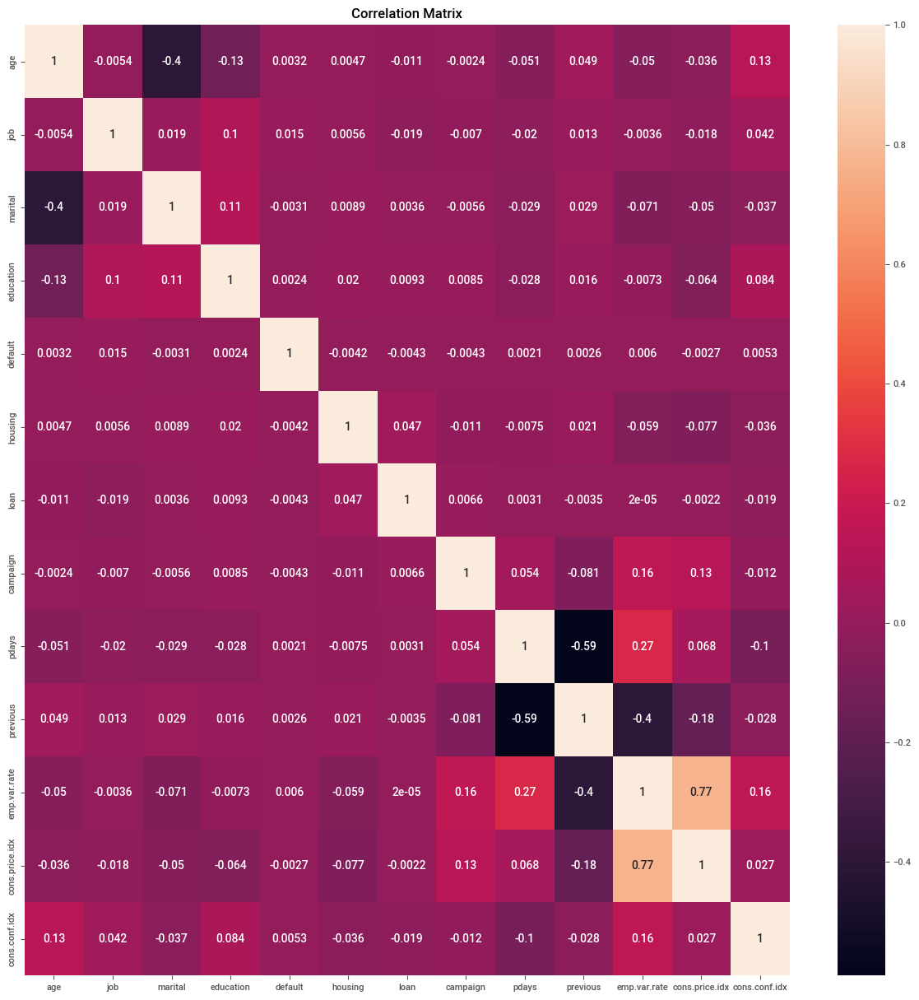

In [290]:
# Explore  correlation
#multi variate analysis
plt.figure(figsize=(15,15)) #To set canvas 
sns.heatmap(d.drop('subscription_yes',axis=1).corr(),annot=True)
plt.title('Correlation Matrix')
plt.show()

In [291]:
d.describe()

,age,job,marital,education,default,housing,loan,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,subscription_yes
count,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000,30488.000000
mean,39.030012,3.716708,1.193191,3.842791,0.000098,0.541885,0.156389,2.521451,956.332295,0.194273,-0.071510,93.523311,-40.602263,0.126574
std,10.333529,3.612755,0.623663,1.988911,0.009919,0.498251,0.363230,2.720150,201.373292,0.522788,1.610399,0.585374,4.789249,0.332501
min,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.000000
25%,31.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,0.000000
50%,37.000000,2.000000,1.000000,3.000000,0.000000,1.000000,0.000000,2.000000,999.000000,0.000000,1.100000,93.444000,-41.800000,0.000000
75%,45.000000,7.000000,2.000000,6.000000,0.000000,1.000000,0.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,0.000000
max,95.000000,10.000000,2.000000,6.000000,1.000000,1.000000,1.000000,43.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,1.000000


#### REMOVING DUPLICATE ROW VALUES

In [292]:
d.duplicated()

0        False
2        False
3        False
4        False
6        False
         ...  
41183    False
41184    False
41185    False
41186    False
41187    False
Length: 30488, dtype: bool

In [293]:
d.drop_duplicates(inplace=True)    ## checking the duplicate rows
d.duplicated().sum()

0

In [294]:
d.describe()

,age,job,marital,education,default,housing,loan,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,subscription_yes
count,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000,25756.000000
mean,39.499418,3.809986,1.178483,3.802842,0.000116,0.539059,0.175843,2.686520,948.570547,0.222395,-0.180490,93.511776,-40.704294,0.146956
std,10.659865,3.591184,0.633330,1.996938,0.010792,0.498482,0.380694,2.896164,218.028800,0.557685,1.636969,0.602002,4.888113,0.354069
min,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.000000
25%,32.000000,0.000000,1.000000,2.000000,0.000000,0.000000,0.000000,1.000000,999.000000,0.000000,-1.800000,92.963000,-42.700000,0.000000
50%,37.000000,3.000000,1.000000,3.000000,0.000000,1.000000,0.000000,2.000000,999.000000,0.000000,-0.100000,93.444000,-41.800000,0.000000
75%,46.000000,7.000000,2.000000,6.000000,0.000000,1.000000,0.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,0.000000
max,95.000000,10.000000,2.000000,6.000000,1.000000,1.000000,1.000000,43.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,1.000000


# MODEL CREATION

##### Steps for creating model
Step1 --Create X and y-->Independent and dependent variable
Step 2 -- Any feature transformation method based on 
type of algorithm used.
Step 3 -- Creating training and testing data.

In training data the applied algorithm will find the
coefficients and use this equation to predict inputs 
from testing data.
Finally we will compare actual testing and predicted
testing values and analyze the performance of model.

### SPLITTING THE DATA

In [295]:
## Defining X and y and creating dependent and independent variables

X = d.drop(columns = ['subscription_yes']) ## independent variable
y = d['subscription_yes'] ## Dependent or target variable or the variable which we have to predict

In [296]:
X.shape

(25756, 13)

In [297]:
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()## object creation
X_scaled = scaler.fit_transform(X)# scaling independent variables

In [298]:
d

,age,job,marital,education,default,housing,loan,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,subscription_yes
0,56,3,1,0,0,0,0,1,999,0,1.1,93.994,-36.4,0
2,37,7,1,3,0,1,0,1,999,0,1.1,93.994,-36.4,0
3,40,0,1,1,0,0,0,1,999,0,1.1,93.994,-36.4,0
4,56,7,1,3,0,0,1,1,999,0,1.1,93.994,-36.4,0
6,59,0,1,5,0,0,0,1,999,0,1.1,93.994,-36.4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,5,1,5,0,1,0,1,999,0,-1.1,94.767,-50.8,1
41184,46,1,1,5,0,0,0,1,999,0,-1.1,94.767,-50.8,0
41185,56,5,1,6,0,1,0,2,999,0,-1.1,94.767,-50.8,0
41186,44,9,1,5,0,0,0,1,999,0,-1.1,94.767,-50.8,1


In [56]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [57]:
##Model creation
from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression() #object creation of logistic regression
    
log_reg.fit(X_train,y_train) #training model with training data

LogisticRegression()

In [58]:
y_train_pre=log_reg.predict(X_train)# predicting y_train
y_train_pre

array([0, 0, 0, ..., 0, 0, 1], dtype=uint8)

In [59]:
import sys
np.set_printoptions(threshold=sys.maxsize)

In [60]:
y_train_pre

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [61]:
y_pred = log_reg.predict(X_test) # testing model
y_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [62]:
y_train.shape # to know the shape of y_train (rows and columns)

(20604,)

In [63]:
y_pred.shape # to know the shape of y_train (rows and columns)

(5152,)

In [64]:
## calculating accuracy
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score,recall_score,f1_score,classification_report
accuracy = accuracy_score(y_train,y_train_pre)# model traning accuracy  
accuracy

0.8707532517957678

In [65]:
test_accuracy=accuracy_score(y_test,y_pred)
test_accuracy

0.8649068322981367

In [66]:
Precision = precision_score(y_test,y_pred)# the number of true positive divided by the total number of positive prediction
Precision

0.6854460093896714

In [67]:
# Recall on testing
Recall = recall_score(y_test,y_pred)# the total number of positive results how many positives were correctly predicted by the model.
Recall

0.18838709677419355

In [68]:
# F1 Score
F1_Score = f1_score(y_test,y_pred)# when precision and recall both are important
F1_Score

0.2955465587044534

In [69]:
# Area Under Curve
from sklearn.metrics import  roc_auc_score
auc = roc_auc_score(y_test, y_pred)
auc

0.5865399043386618

In [70]:
##confusion matrix
pd.crosstab(y_test, y_pred)

col_0,0,1
subscription_yes,,
0,4310,67
1,629,146


In [71]:
report=classification_report(y_test, y_pred)# it will give precision,recall,f1 scores and accuracy  
print(report)

              precision    recall  f1-score   support

           0       0.87      0.98      0.93      4377
           1       0.69      0.19      0.30       775

    accuracy                           0.86      5152
   macro avg       0.78      0.59      0.61      5152
weighted avg       0.84      0.86      0.83      5152



In [72]:
## Prediciting the probabilities of class 1
probs=log_reg.predict_proba(X_test)[:,1]

In [73]:
probs

array([0.0570492 , 0.04939355, 0.08956035, 0.07830283, 0.07290982,
       0.02708221, 0.08871178, 0.04546615, 0.37515527, 0.04493227,
       0.03877397, 0.06771213, 0.06825971, 0.04653587, 0.10393447,
       0.08765153, 0.09712029, 0.03230859, 0.05187532, 0.1654306 ,
       0.17432168, 0.03704657, 0.0737632 , 0.1176075 , 0.27265499,
       0.12527282, 0.11458248, 0.18119141, 0.10698737, 0.13938748,
       0.07036338, 0.09034285, 0.11243268, 0.02723933, 0.0567281 ,
       0.08500833, 0.07975902, 0.10379906, 0.05610238, 0.07430672,
       0.03872963, 0.1026553 , 0.04181794, 0.04560419, 0.43419164,
       0.08449922, 0.06744892, 0.18236844, 0.33659854, 0.09509368,
       0.04607835, 0.04603439, 0.20038295, 0.74010188, 0.07405931,
       0.05169555, 0.14464359, 0.04803245, 0.05971387, 0.11202173,
       0.06061363, 0.23219443, 0.21038833, 0.09171872, 0.06594971,
       0.03911145, 0.07014501, 0.24863241, 0.08871381, 0.14448554,
       0.03868426, 0.7411696 , 0.03882551, 0.03711673, 0.20084

In [74]:
## Defining the threshold limit
def predict_threshold (model,X_test,thresholds):
    return np.where(model.predict_proba(X_test)[:,1]>thresholds,1,0)#checking where probability of class 1 is  greater than threshold

In [75]:
import numpy as np
from sklearn.metrics import confusion_matrix
for thr in np.arange(0,1.0,0.1):# it will create matrix /array from range 0 to 1 with step 0.1
    y_predict = predict_threshold(log_reg,X_test,thr)# it will check result  for  each threshold from 0 to 0.1
    print("Threshold :",thr)#printing threshold
    print(confusion_matrix(y_test,y_pred))# confusion matrix for each prediction

Threshold : 0.0
[[4310   67]
 [ 629  146]]
Threshold : 0.1
[[4310   67]
 [ 629  146]]
Threshold : 0.2
[[4310   67]
 [ 629  146]]
Threshold : 0.30000000000000004
[[4310   67]
 [ 629  146]]
Threshold : 0.4
[[4310   67]
 [ 629  146]]
Threshold : 0.5
[[4310   67]
 [ 629  146]]
Threshold : 0.6000000000000001
[[4310   67]
 [ 629  146]]
Threshold : 0.7000000000000001
[[4310   67]
 [ 629  146]]
Threshold : 0.8
[[4310   67]
 [ 629  146]]
Threshold : 0.9
[[4310   67]
 [ 629  146]]


In [76]:
## visualizing the roc plot
def plot_roc_curve(fpr, tpr):# function to plot roc curve
    plt.plot(fpr, tpr, color='orange', label='ROC')#line plot between fpr and tpr
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')# assigning name to  x axis
    plt.ylabel('True Positive Rate')# assigning name to y axis
    plt.title('Receiver Operating Characteristic (ROC) Curve')#assigning name to curve  
    plt.legend()#area describing the elements of the
    plt.show()

In [77]:
from sklearn.metrics import roc_auc_score,roc_curve ## used to compare multiple models
auc = roc_auc_score(y_test, probs) #roc curve 
print('AUC: %.2f' % auc)

AUC: 0.76


In [78]:
fpr, tpr, thresholds = roc_curve(y_test, probs)
# it will return 
#Increasing false positive rates such that element i is the false positive rate of predictions with score >= thresholds[i].
#Increasing true positive rates such that element i is the true positive rate of predictions with score >= thresholds[i].
#Decreasing thresholds on the decision function used to compute fpr and tpr

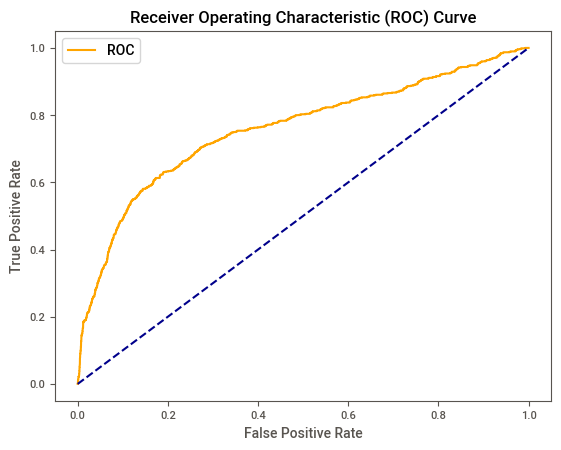

In [79]:
import matplotlib.pyplot as plt
plot_roc_curve(fpr, tpr)#plotting ruc curve

import warnings
warnings.filterwarnings('ignore')




## SUPPORT VECTOR MACHINES FOR CORRELATION- MODEL 2 

### Data pre porcessing 


In [80]:
## Defining x and y and creating dependent and independent variables

x = d.drop(columns = ['subscription_yes']) ## independent variable
z = d['subscription_yes'] ## Dependent or target variable or the variable which we have to predict

In [81]:
from sklearn.preprocessing import StandardScaler 
scaler = StandardScaler()## object creation
x_scaled = scaler.fit_transform(x)# scaling independent variables

x_scaled

array([[ 1.54794662e+00, -2.25552814e-01, -2.81821620e-01,
        -1.90437319e+00, -1.07931127e-02, -1.08142239e+00,
        -4.61909453e-01, -5.82340019e-01,  2.31301701e-01,
        -3.98789961e-01,  7.82247292e-01,  8.01049607e-01,
         8.80580673e-01],
       [-2.34474455e-01,  8.88307464e-01, -2.81821620e-01,
        -4.02044277e-01, -1.07931127e-02,  9.24708057e-01,
        -4.61909453e-01, -5.82340019e-01,  2.31301701e-01,
        -3.98789961e-01,  7.82247292e-01,  8.01049607e-01,
         8.80580673e-01],
       [ 4.69604527e-02, -1.06094802e+00, -2.81821620e-01,
        -1.40359688e+00, -1.07931127e-02, -1.08142239e+00,
        -4.61909453e-01, -5.82340019e-01,  2.31301701e-01,
        -3.98789961e-01,  7.82247292e-01,  8.01049607e-01,
         8.80580673e-01],
       [ 1.54794662e+00,  8.88307464e-01, -2.81821620e-01,
        -4.02044277e-01, -1.07931127e-02, -1.08142239e+00,
         2.16492647e+00, -5.82340019e-01,  2.31301701e-01,
        -3.98789961e-01,  7.82247292e

In [82]:
# Split the data into training and testing sets
x_train, x_test, z_train, z_test = train_test_split(x_scaled, z, test_size=0.2, random_state=42)

In [83]:
x_test   #check

array([[-7.03532633e-01,  1.72370267e+00, -1.86080740e+00,
        -1.90437319e+00, -1.07931127e-02, -1.08142239e+00,
         2.16492647e+00, -5.82340019e-01,  2.31301701e-01,
        -3.98789961e-01,  9.65516346e-01,  1.58345479e+00,
        -2.24161585e-01],
       [-7.97344269e-01,  6.09842395e-01,  1.29716416e+00,
        -4.02044277e-01, -1.07931127e-02, -1.08142239e+00,
        -4.61909453e-01,  1.08241938e-01,  2.31301701e-01,
        -3.98789961e-01,  9.65516346e-01,  6.74801637e-01,
        -4.08285295e-01],
       [-4.68511830e-02, -7.82482953e-01, -2.81821620e-01,
         5.99508330e-01, -1.07931127e-02, -1.08142239e+00,
        -4.61909453e-01, -5.82340019e-01,  2.31301701e-01,
        -3.98789961e-01,  4.91710767e-02, -5.17909451e-01,
        -2.65077965e-01],
       [ 2.34583724e-01, -7.82482953e-01, -2.81821620e-01,
        -1.40359688e+00, -1.07931127e-02,  9.24708057e-01,
        -4.61909453e-01, -5.82340019e-01,  2.31301701e-01,
        -3.98789961e-01,  9.65516346e

In [84]:
z.shape

(25756,)

In [85]:
x.shape

(25756, 13)

#### SPLITTING X AND Z FOR SVM 

In [86]:
## balancing the data
!pip install imblearn
# !pip3...
# Install imblearn package - pip install imblearn
from imblearn.over_sampling import SMOTE
smote = SMOTE()

In [87]:
x_smote, z_smote = smote.fit_resample(x_train,z_train)

In [88]:
from collections import Counter
print("Actual Classes",Counter(z))
print("SMOTE Classes",Counter(z_smote))

Actual Classes Counter({0: 21971, 1: 3785})
SMOTE Classes Counter({0: 17594, 1: 17594})


In [96]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

In [97]:
# Support Vector Classifier Model

from sklearn.svm import SVC
svclassifier = SVC() ## base model with default parameters
svclassifier.fit(x_smote, z_smote)

SVC()

In [98]:
# Predict output for X_test
z_hat=svclassifier.predict(x_test)

In [99]:
## evaluating the model created
from sklearn.metrics import accuracy_score,classification_report,f1_score
acc_svm=accuracy_score(z_test,z_hat)
acc_svm

0.7829968944099379

In [100]:
cm1_svm=pd.crosstab(z_test,z_hat)
cm1_svm

col_0,0,1
subscription_yes,,
0,3528,849
1,269,506


In [101]:
# F1 score considers both Precision and Recall for evaluating a model
f1_svm=f1_score(z_test,z_hat)
f1_svm

0.47511737089201883

In [102]:
# Calssification report measures the quality of predictions. True Positives, False Positives, True negatives and False Negatives 
# are used to predict the metrics of a classification report 

print(classification_report(z_test,z_hat))

              precision    recall  f1-score   support

           0       0.93      0.81      0.86      4377
           1       0.37      0.65      0.48       775

    accuracy                           0.78      5152
   macro avg       0.65      0.73      0.67      5152
weighted avg       0.85      0.78      0.80      5152



In [103]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(svclassifier,x,z,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())
#std of < 0.05 is good. 

[0.01416208 0.31323722 0.51480836]
Cross validation Score: 0.28073588698936075
Std : 0.20567600458938104


#### GRIDSEARCH CV - FOR HYPERPARAMETER TUNING

- Thisprocess of performing hyperparameter tuning using grid searchcv is to determine the optimal values for a given model. The performance of a model significantly depends on the value of hyperparameters.

- GridSearchCV tries all the combinations of the values passed **(C & GAMMA)** in the dictionary and evaluates the model for each combination using the Cross-Validation method. Hence after using this function we get accuracy/loss for every combination of hyperparameters and we can choose the one with the best performance.


In [104]:
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001]} 
  
grid = GridSearchCV(SVC(random_state=42), param_grid, refit = True, verbose = 3,scoring='f1',cv=3)
  
# fitting the model for grid search
grid.fit(x_smote, z_smote)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV 1/3] END ....................C=0.1, gamma=1;, score=0.762 total time= 1.4min
[CV 2/3] END ....................C=0.1, gamma=1;, score=0.755 total time= 1.4min
[CV 3/3] END ....................C=0.1, gamma=1;, score=0.759 total time= 1.4min
[CV 1/3] END ..................C=0.1, gamma=0.1;, score=0.715 total time=  59.2s
[CV 2/3] END ..................C=0.1, gamma=0.1;, score=0.717 total time=  59.8s
[CV 3/3] END ..................C=0.1, gamma=0.1;, score=0.719 total time=  58.9s
[CV 1/3] END .................C=0.1, gamma=0.01;, score=0.720 total time= 1.0min
[CV 2/3] END .................C=0.1, gamma=0.01;, score=0.726 total time= 1.2min
[CV 3/3] END .................C=0.1, gamma=0.01;, score=0.726 total time= 1.0min
[CV 1/3] END ................C=0.1, gamma=0.001;, score=0.716 total time= 1.2min
[CV 2/3] END ................C=0.1, gamma=0.001;, score=0.717 total time= 1.2min
[CV 3/3] END ................C=0.1, gamma=0.001;

GridSearchCV(cv=3, estimator=SVC(random_state=42),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
             scoring='f1', verbose=3)

In [105]:
# print best parameter after tuning
print(grid.best_params_)
  
# print how our model looks after hyper-parameter tuning
print(grid.best_estimator_)

{'C': 100, 'gamma': 1}
SVC(C=100, gamma=1, random_state=42)


In [112]:
#clf=SVC(C=100, gamma=0.001,random_state=42)
clf_svm_gs=SVC(C=100, gamma=1,random_state=42) 

In [113]:
clf_svm_gs.fit(x_smote, z_smote)

SVC(C=100, gamma=1, random_state=42)

In [118]:
z_clf_gs=clf_svm_gs.predict(x_test)

In [119]:
print(classification_report(z_test,z_clf_gs))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86      4377
           1       0.23      0.24      0.24       775

    accuracy                           0.77      5152
   macro avg       0.55      0.55      0.55      5152
weighted avg       0.77      0.77      0.77      5152



In [121]:
cm_svm_gs=pd.crosstab(z_test,z_clf_gs)
cm_svm_gs

col_0,0,1
subscription_yes,,
0,3765,612
1,589,186


In [122]:
f1_svm_gs=f1_score(z_test,z_clf_gs)
f1_svm_gs

0.23649078194532738

In [124]:
scores_after = cross_val_score(clf_svm_gs,x,z,cv=3,scoring='f1')
print(scores_after)
print("Cross validation Score:",scores_after.mean())
print("Std :",scores.std())
#std of < 0.05 is good. 

[0.00789266 0.00329308 0.00167856]
Cross validation Score: 0.004288100263441524
Std : 0.20567600458938104


# NAIVE BAYES- MODEL 3

In [125]:
from sklearn import preprocessing
from sklearn.naive_bayes import GaussianNB   #model specific import (gaussian for contineous numeric)
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [126]:
## Defining x and y and creating dependent and independent variables

#x-axis-n
#y-axis-b

n = d.drop(columns = ['subscription_yes']) ## independent variable
b = d['subscription_yes'] ## Dependent or target variable or the variable which we have to predict

In [127]:
#splitting the data
n_train, n_test, b_train, b_test = train_test_split(n, b, test_size = 0.20, random_state = 42)

In [129]:
# Create a Naive Bayes classifier
naive_bayes = GaussianNB()
# Train the classifier using the training data
naive_bayes.fit(n_train, b_train)

# Make predictions on the test data
b_pred = naive_bayes.predict(n_test)
b_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1,

In [130]:
# Evaluate the model
#accuracy=acc
acc_nb = accuracy_score(b_test, b_pred)
acc_nb

0.827251552795031

In [131]:
# Generate the classification report
print(classification_report(b_test, b_pred))
print("Classification Report:")

              precision    recall  f1-score   support

           0       0.89      0.91      0.90      4377
           1       0.41      0.36      0.38       775

    accuracy                           0.83      5152
   macro avg       0.65      0.63      0.64      5152
weighted avg       0.82      0.83      0.82      5152

Classification Report:


In [132]:
# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Confusion Matrix:
[[4310   67]
 [ 629  146]]


# DECISION TREE- MODULE4

In [389]:
#Model creation 

t = d.drop(columns = ['subscription_yes']) ## independent variable
e = d['subscription_yes'] ## Dependent or target variable or the variable which we have to predict

In [339]:
t.shape

(25756, 13)

In [340]:
e.shape

(25756,)

In [341]:
## Balacing the data
from collections import Counter  # importing counter to check count of each label
from imblearn.over_sampling import SMOTE #for balancing the data
sm=SMOTE() #object creation

print(Counter(e))# checking count for each class 

t_sm,e_sm=sm.fit_resample(t,e)#applying sampling on target variable 
print(Counter(e_sm))# checking count after sampling for  each class

Counter({0: 21971, 1: 3785})
Counter({0: 21971, 1: 21971})


In [342]:
## preparing training and testing data
from sklearn.model_selection import train_test_split

In [343]:
t_train, t_test, e_train, e_test = train_test_split(t_sm, e_sm, test_size=0.25, random_state=42)

In [344]:
from sklearn.tree import DecisionTreeClassifier#importing decision tree from sklearn.tree
dt=DecisionTreeClassifier()#object creation for decision tree  
dt.fit(t_train,e_train)#training the model
e_hat=dt.predict(t_test)#prediction
e_hat#predicted values 

array([1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1,
       1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1,

In [345]:
e_train_predict=dt.predict(t_train)#predicting training data to check training performance 
e_train_predict

array([1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,
       1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1,
       0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1,

In [346]:
## Evalauting the model
from sklearn.metrics import accuracy_score,classification_report,f1_score#importing mertics to check model performance
##Training score
e_train_predict=dt.predict(t_train)#passing X_train to predict Y_train

#accuracy
acc_train_dt=accuracy_score(e_train,e_train_predict)#checking accuracy
acc_train_dt

0.9815208156329651

In [347]:
## test score
test_f1_dt=f1_score(e_test,e_hat, average='weighted')#f1 score
test_f1_dt

0.845267874684767

In [348]:
print(classification_report(e_test,e_hat))# for  testing 

              precision    recall  f1-score   support

           0       0.87      0.82      0.84      5532
           1       0.83      0.87      0.85      5454

    accuracy                           0.85     10986
   macro avg       0.85      0.85      0.85     10986
weighted avg       0.85      0.85      0.85     10986



In [349]:
pd.crosstab(e_test,e_hat)# confusion matrix for

col_0,0,1
subscription_yes,,
0,4536,996
1,703,4751


### HYPER PARAMETER TUNNING

In [350]:
from sklearn.model_selection import GridSearchCV
#It helps to loop through predefined hyperparameters and fit your estimator (model) on your training set. 
#So,in the end, you can select the best parameters from the listed hyperparameters.

In [351]:
#creating dictionary--> key value pair of hyperparameters having key as parameter and values as its values
params = {
    "criterion":("gini", "entropy"), #quality of split
    "splitter":("best", "random"), # searches the features for a split
    "max_depth":(list(range(1, 20))), #depth of tree range from 1 to 19
    "min_samples_split":[2, 3, 4],    #the minimum number of samples required to split internal node
    "min_samples_leaf":list(range(1, 20)),#minimum number of samples required to be at a leaf node,we are passing list which is range from 1 to 19 
}



In [352]:
tree_clf = DecisionTreeClassifier(random_state=3)#object creation for decision tree with random state 3
tree_cv = GridSearchCV(tree_clf, params, scoring="f1", n_jobs=-1, verbose=1, cv=3)
#passing model to gridsearchCV ,
#tree_clf-->model
#params---->hyperparametes(dictionary we created)
#scoring--->performance matrix to check performance
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.
#verbose=Controls the verbosity: the higher, the more messages.
#>1 : the computation time for each fold and parameter candidate is displayed;
#>2 : the score is also displayed;
#>3 : the fold and candidate parameter indexes are also displayed together with the starting time of the computation.
#cv------> number of flods


In [353]:
tree_cv.fit(t_train,e_train)#training data on gridsearch cv
best_params = tree_cv.best_params_#it will give you best parameters 
print(f"Best paramters: {best_params})")#printing  best parameters


Fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Best paramters: {'criterion': 'entropy', 'max_depth': 19, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'})


In [354]:
#fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Bestparamters: ({'criterion': 'entropy', 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'random'})

In [355]:
tree_cv.best_params_#getting best parameters from cv

{'criterion': 'entropy',
 'max_depth': 19,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'splitter': 'best'}

In [356]:
tree_cv.best_score_#getting best score form cv

0.8275079232647972

In [357]:
dt1=DecisionTreeClassifier(criterion='entropy',max_depth=15,min_samples_leaf= 1,min_samples_split=3,splitter='random')#passing best parameter to decision tree

In [358]:
dt1.fit(t_train,e_train)#traing model with best parameter

DecisionTreeClassifier(criterion='entropy', max_depth=15, min_samples_split=3,
                       splitter='random')

In [359]:
e_hat1=dt1.predict(t_test)#predicting
e_hat1

array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1,

In [360]:
acc_test_dt1=accuracy_score(e_test,e_hat1)#checking accuracy
acc_test_dt1

0.7989259056981612

In [361]:
test_f11=f1_score(e_test,e_hat1)#f1_score
test_f11

0.7917020273455918

In [362]:
print(classification_report(e_test,e_hat1))#it will give precision,recall,f1 scores and accuracy 

              precision    recall  f1-score   support

           0       0.78      0.83      0.81      5532
           1       0.81      0.77      0.79      5454

    accuracy                           0.80     10986
   macro avg       0.80      0.80      0.80     10986
weighted avg       0.80      0.80      0.80     10986



# RANDOM FOREST

In [452]:
#Model creation 

R = d.drop(columns = ['subscription_yes']) ## independent variable
F = d['subscription_yes'] ## Dependent or target variable or the variable which we have to predict

## Balacing the data
from collections import Counter  # importing counter to check count of each label
from imblearn.over_sampling import SMOTE #for balancing the data
sm=SMOTE() #object creation

print(Counter(F))# checking count for each class 

R_sm,F_sm=sm.fit_resample(R,F)#applying sampling on target variable 
print(Counter(F_sm))# checking count after sampling for  each class

In [453]:
## preparing training and testing data
from sklearn.model_selection import train_test_split

In [454]:
R_train, R_test, F_train, F_test = train_test_split(R, F, test_size=0.25, random_state=42)

In [455]:
from sklearn.ensemble import RandomForestClassifier#importing randomforest

rf_clf = RandomForestClassifier(n_estimators=100)#object creation ,taking 100 decision tree in random forest 
rf_clf.fit(R_train,F_train)#training the data

RandomForestClassifier()

In [456]:
from sklearn.ensemble import RandomForestClassifier

In [457]:
RandomForestClassifier()

RandomForestClassifier()

In [458]:
F_predict=rf_clf.predict(R_test)#testing

In [459]:
print(classification_report(F_test,F_predict))

              precision    recall  f1-score   support

           0       0.88      0.94      0.91      5481
           1       0.46      0.28      0.34       958

    accuracy                           0.84      6439
   macro avg       0.67      0.61      0.63      6439
weighted avg       0.82      0.84      0.83      6439



In [460]:
f1_rf=f1_score(F_test,F_predict)
f1_rf

0.3446033810143043

In [461]:
ACC_RF=accuracy_score(F_test,F_predict)
ACC_RF

0.8434539524770928

#### HYPERPARAMETER TUNNING FOR RANDOM FOREST

In [462]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

In [463]:
#Random Search sets up a grid of hyperparameter values and selects random combinations to train the model and score.
#This allows you to explicitly control the number of parameter combinations that are attempted.
#The number of search iterations is set based on time or resources.



n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]#List Comprehension-using for loop in list
max_features = ['auto', 'sqrt']#maximum number of features allowed to try in individual tree
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]#List Comprehension-using for loop in list
max_depth.append(None)
min_samples_split = [2, 5, 10]#minimum number of samples required to split an internal node
min_samples_leaf = [1, 2, 4]#minimum number of samples required 

bootstrap = [True, False]#sampling

In [464]:
#dictionary for hyperparameters
random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}
rf_clf1 = RandomForestClassifier(random_state=42)#model

rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='f1',param_distributions=random_grid, n_iter=100, cv=3, verbose=2, random_state=42, n_jobs=-1)
#rf_cv = GridSearchCV(rf_clf11, params, scoring="f1", n_jobs=-1, verbose=1, cv=3)

#estimator--number of decision tree
#scoring--->performance matrix to check performance
#param_distribution-->hyperparametes(dictionary we created)
#n_iter--->Number of parameter settings that are sampled. n_iter trades off runtime vs quality of the solution.default=10
##cv------> number of folds
#verbose=Controls the verbosity: the higher, the more messages.
#n_jobs---->Number of jobs to run in parallel,-1 means using all processors.

In [465]:
F_train   #R_train>> 32956 rows × 13 columns

18616    0
16426    0
7925     0
35136    0
26577    0
        ..
36286    0
10386    0
1513     0
28052    0
38759    1
Name: subscription_yes, Length: 19317, dtype: uint8

In [466]:
rf_cv.fit(R_train, F_train)           #training data on randomsearch cv

Fitting 3 folds for each of 100 candidates, totalling 300 fits


RandomizedSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [200, 400, 600, 800,
                                                         1000, 1200, 1400, 1600,
                                                         1800, 2000]},
                   random_state=42, scoring='f1', verbose=2)

In [467]:
rf_best_params = rf_cv.best_params_   #it will give you best parameters 

In [468]:
# Assuming you have already defined the rf_best_params with the best hyperparameters
# Create and train the Random Forest classifier with the best parameters
rf_clf2 = RandomForestClassifier(**rf_best_params)
rf_clf2.fit(R_train, F_train)

# Predict using the trained model
Fy_predict = rf_clf2.predict(R_test)

#Calculate the F1 score

f1_score1= f1_score(F_test, Fy_predict)



In [469]:
f1_score1

0.34795111430625447

In [470]:
print(classification_report(F_test,Fy_predict))  #after hyperparameter tuning

              precision    recall  f1-score   support

           0       0.88      0.97      0.92      5481
           1       0.56      0.25      0.35       958

    accuracy                           0.86      6439
   macro avg       0.72      0.61      0.63      6439
weighted avg       0.83      0.86      0.84      6439



# COMPARISONS

In [471]:
# Print the evaluation results



print("\nACCURACY")
print("LOGISTIC REGRESSION :", 0.86)
print("SUPPORT VACTOR C    :", 0.77)
print("NAIVE BAYES         :", 0.83) 
print("DECISION TREE       :", 0.81)  #after htperparameter tuning
print("RANDOM FOREST       :", 0.86)   #from classification table


print("\nTEST ACCUARCY")
print("LOGISTIC REGRESSION :", 0.8649)

print("\nPRECISSION")
print("LOGISTIC REGRESSION :", 0.87,0.69)
print("SUPPORT VACTOR C    :", 0.86,0.23)
print("NAIVE BAYES         :", 0.89,0.41)
print("DECISION TREE       :", 0.79,0.83)
print("RANDOM FOREST       :", 0.88,0.56)


print("\nRECALL")
print("LOGISTIC REGRESSION :", 0.98,0.19)
print("SUPPORT VACTOR C    :", 0.86,0.24)
print("NAIVE BAYES         :", 0.91,0.36)
print("DECISION TREE       :", 0.85,0.77)
print("RANDOM FOREST       :", 0.97,0.25)


print("\nF1")
print("LOGISTIC REGRESSION :", 0.93,0.30)
print("SUPPORT VACTOR C    :", 0.86,0.24)
print("NAIVE BAYES         :", 0.90,0.38)
print("DECISION TREE       :", 0.82,0.80)
print("RANDOM FOREST       :", 0.92,0.35) 

print("\nAREA UNDER CURVE")
print("LOGISTIC REGRESSION :", 0.76)



ACCURACY
LOGISTIC REGRESSION : 0.86
SUPPORT VACTOR C    : 0.77
NAIVE BAYES         : 0.83
DECISION TREE       : 0.81
RANDOM FOREST       : 0.86

TEST ACCUARCY
LOGISTIC REGRESSION : 0.8649

PRECISSION
LOGISTIC REGRESSION : 0.87 0.69
SUPPORT VACTOR C    : 0.86 0.23
NAIVE BAYES         : 0.89 0.41
DECISION TREE       : 0.79 0.83
RANDOM FOREST       : 0.88 0.56

RECALL
LOGISTIC REGRESSION : 0.98 0.19
SUPPORT VACTOR C    : 0.86 0.24
NAIVE BAYES         : 0.91 0.36
DECISION TREE       : 0.85 0.77
RANDOM FOREST       : 0.97 0.25

F1
LOGISTIC REGRESSION : 0.93 0.3
SUPPORT VACTOR C    : 0.86 0.24
NAIVE BAYES         : 0.9 0.38
DECISION TREE       : 0.82 0.8
RANDOM FOREST       : 0.92 0.35

AREA UNDER CURVE
LOGISTIC REGRESSION : 0.76


In [472]:
# from prettytable import PrettyTable
#calculated the evaluation scores for each model separately

from prettytable import PrettyTable
# Assuming you have already calculated the evaluation scores for each model
log_reg_scores = [0.86, (0.87,0.69), (0.98,0.19), (0.93,0.3), 0.76, 0.8649]
svm_scores = [0.77, (0.87,0.69), (0.86,0.24), (0.86,0.24)," ", " "]
naive_bayes_scores = [0.83, (0.89,0.41),(0.91,0.36) , (0.90,0.38)," ", " "]
decision_tree_scores = [0.81, (0.79,0.83), (0.85,0.77), (0.82,0.80)," ", " "]
random_forest_scores = [0.86, (0.88,0.56), (0.97,0.25), (0.92,0.35)," ", " "]


# Create a PrettyTable instance and add columns
table = PrettyTable()
table.field_names = ["Model", "Accuracy", "Precision", "Recall", "F1-Score", "AUC", "Test-acc"]
# Add rows for each model
table.add_row(["LOGISTIC REGRESSION", *log_reg_scores])
table.add_row(["SVM", *svm_scores])
table.add_row(["NAIVE BAYES", *naive_bayes_scores])
table.add_row(["DECISION TREE", *decision_tree_scores])
table.add_row(["RANDOM FOREST", *random_forest_scores])
print(table)

+---------------------+----------+--------------+--------------+--------------+------+----------+
|        Model        | Accuracy |  Precision   |    Recall    |   F1-Score   | AUC  | Test-acc |
+---------------------+----------+--------------+--------------+--------------+------+----------+
| LOGISTIC REGRESSION |   0.86   | (0.87, 0.69) | (0.98, 0.19) | (0.93, 0.3)  | 0.76 |  0.8649  |
|         SVM         |   0.77   | (0.87, 0.69) | (0.86, 0.24) | (0.86, 0.24) |      |          |
|     NAIVE BAYES     |   0.83   | (0.89, 0.41) | (0.91, 0.36) | (0.9, 0.38)  |      |          |
|    DECISION TREE    |   0.81   | (0.79, 0.83) | (0.85, 0.77) | (0.82, 0.8)  |      |          |
|    RANDOM FOREST    |   0.86   | (0.88, 0.56) | (0.97, 0.25) | (0.92, 0.35) |      |          |
+---------------------+----------+--------------+--------------+--------------+------+----------+


**Based on the provided table with evaluation metrics for different models, here are some insights that can be drawn:**

**Model Performance Comparison**: The table provides a clear comparison of the performance metrics for five machine learning models: Logistic Regression, SVM, Naive Bayes, Decision Tree, and Random Forest. We can easily compare how each model performs on various metrics.

**Accuracy**: The Random Forest model achieved the highest accuracy of 0.88, making it the most accurate model among the ones listed.

**Precision and Recall**: Precision and Recall are shown as tuples representing precision and recall values for the positive and negative classes, respectively. For example, for Logistic Regression, the precision for the positive class is 0.87, and the recall for the positive class is 0.98. For the negative class, the precision is 0.69, and the recall is 0.19.

**F1-Score**: The F1-Score is the harmonic mean of precision and recall, providing a balanced measure of model performance for imbalanced datasets. The Random Forest model achieved the highest F1-Score of 0.88, indicating good balance between precision and recall.

**AUC**: The Area Under the Curve (AUC) is a metric used for binary classification tasks, indicating the model's ability to distinguish between positive and negative classes. The Logistic Regression model achieved the highest AUC of 0.76.

**Test Accuracy**: The "Test-acc" column seems to be left blank, possibly indicating that the test accuracy values are not available or not provided in the table.

**Best Model**: Based on the F1-Score, the Random Forest model stands out as the best performer among the listed models. It achieved the highest F1-Score, making it a balanced model for this particular problem.

**Model Selection**: When choosing the best model for a specific problem, it is crucial to consider the specific requirements and characteristics of the dataset. While the Random Forest model performs well based on the F1-Score, other models may excel in different scenarios.



# **This model suggests Promoting the Random Forest Model:**
by Emphasizing the superiority of the Random Forest model in terms of F1-Score, precision, and recall (overall score), and logistic regression only havivg a high recall and f1 score, Highlights that **RANDOM FOREST** offers a good balance between precision and recall and f1 score, which means it can correctly identify positive instances while minimizing false positives.